# Railway Track Fault Detection
---
|Subject:|Mathematical Modeling Practice|
|---|---|
|Semester:|Fall 2022|
|Name:|Tamás Demus|
|NEPTUN:|XP4B9D|
---

## Dataset
---
|Name:|Railway Track Fault Detection|
|---|---|
|Link to dataset:|https://www.kaggle.com/datasets/salmaneunus/railway-track-fault-detection|
---

Importing modules

In [230]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

import cv2 as cv

from sklearn.metrics import ConfusionMatrixDisplay

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

from tqdm import trange, tqdm
import os

Setting up environment

In [85]:
raw_folder = './raw/'
data_folder = './data/'
preprocessed_folder = './preprocessed/'

PATH = [
    'Train/Non defective/',
    'Train/Defective/',
    'Validation/Non defective/',
    'Validation/Defective/',
    'Test/Non defective/',
    'Test/Defective/',
]

RAW_PATH = [os.path.join(raw_folder, p) for p in PATH]
DATA_PATH = [os.path.join(data_folder, p) for p in PATH]
PREPROCESSED_PATH = [os.path.join(preprocessed_folder, p) for p in PATH]

for p in PREPROCESSED_PATH:
    if not os.path.exists(p):
        os.makedirs(p)
        
for p in DATA_PATH:
    if not os.path.exists(p):
        os.makedirs(p)

Check file types

In [86]:
ext = []

for p in RAW_PATH:
    for f in os.listdir(p):
        ext.append(os.path.splitext(f)[-1])
    
print(set(ext))

{'.jpg', '.webp', '.jpeg'}


Copying raw dataset with new filenames and converting the extensions

In [91]:
i = 0
p_new = 0
for p in RAW_PATH:
    for f in tqdm(os.listdir(p), desc=p):
        src = os.path.join(p, f)
        dst = os.path.join(DATA_PATH[p_new], str(i)+'.jpg')
        img = cv.imread(src)
        cv.imwrite(dst, img)
        i += 1
    p_new += 1


Creating image dataframe

In [92]:
images = pd.DataFrame(columns=[
    'type',
    'defect',
    'defect_str',
    'path',
    'filename',
    'img'
])

for each in DATA_PATH:
    p = each.split('/')
    t = p[2].lower()
    if p[3] == 'Defective':
        y = 1
    else:
        y = 0
    for img in os.listdir(each):
        d = {
            'type': t,
            'defect': y,
            'defect_str': p[3],
            'path': each,
            'filename': img,
            'img': os.path.join(each, img)
        }
        df = pd.DataFrame(data=d, index=[1])
        images = pd.concat([images, df])

images.reset_index(inplace=True, drop=True)
images

,type,defect,defect_str,path,filename,img
0,train,0,Non defective,./data/Train/Non defective/,97.jpg,./data/Train/Non defective/97.jpg
1,train,0,Non defective,./data/Train/Non defective/,79.jpg,./data/Train/Non defective/79.jpg
2,train,0,Non defective,./data/Train/Non defective/,114.jpg,./data/Train/Non defective/114.jpg
3,train,0,Non defective,./data/Train/Non defective/,18.jpg,./data/Train/Non defective/18.jpg
4,train,0,Non defective,./data/Train/Non defective/,46.jpg,./data/Train/Non defective/46.jpg
...,...,...,...,...,...,...
379,test,1,Defective,./data/Test/Defective/,381.jpg,./data/Test/Defective/381.jpg
380,test,1,Defective,./data/Test/Defective/,379.jpg,./data/Test/Defective/379.jpg
381,test,1,Defective,./data/Test/Defective/,377.jpg,./data/Test/Defective/377.jpg
382,test,1,Defective,./data/Test/Defective/,380.jpg,./data/Test/Defective/380.jpg


Check the shape of the images

In [93]:
img_shape = []
for each in tqdm(images.img):
    image = cv.imread(each)
    img_shape.append(image.shape)

100%|██████████| 384/384 [01:59<00:00,  3.21it/s]


Minimum  width  :  148  @  243
Maximum  width  :  8000  @  241
Minimum  height  :  156  @  297
Maximum  height  :  8000  @  152
Minimum  components  :  3  @  0
Maximum  components  :  3  @  0
Minimum  size  :  28712  @  243
Maximum  size  :  48000000  @  152


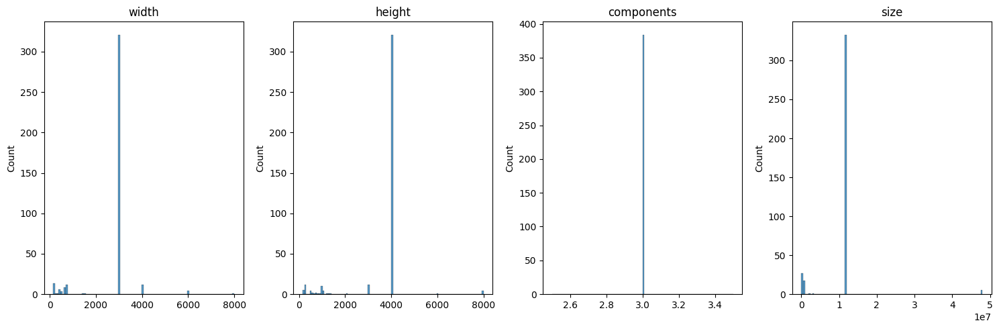

In [94]:
img_shape = np.array(img_shape)

fig, ax = plt.subplots(1, 4, figsize=(15, 5), tight_layout=True)

dims = ['width', 'height', 'components','size']
for i, dim in enumerate(dims):
    if i < 3:
        vector = img_shape[:, i]
    else:
        vector = img_shape[:, 0] * img_shape[:, 1]
    sns.histplot(vector, bins=100, ax=ax[i])
    ax[i].set_title(dim)
    print('Minimum ', dim, ' : ', min(vector), ' @ ', np.argmin(vector))
    print('Maximum ', dim, ' : ', max(vector), ' @ ', np.argmax(vector))



Check if dataset is balanced

In [95]:
images.groupby(['type', 'defect_str']).count()

defect  path  filename  img
type       defect_str                                
test       Defective          11    11        11   11
           Non defective      11    11        11   11
train      Defective         150   150       150  150
           Non defective     150   150       150  150
validation Defective          31    31        31   31
           Non defective      31    31        31   31

Generating random sample from training data

In [96]:
N_samples = 16
random_sample_idx = []
for i in range(N_samples):
    idx = np.random.choice(images[images.type == 'train'].index)
    random_sample_idx.append(idx)
random_sample = images.iloc[random_sample_idx].copy()
random_sample

,type,defect,defect_str,path,filename,img
60,train,0,Non defective,./data/Train/Non defective/,50.jpg,./data/Train/Non defective/50.jpg
107,train,0,Non defective,./data/Train/Non defective/,111.jpg,./data/Train/Non defective/111.jpg
249,train,1,Defective,./data/Train/Defective/,180.jpg,./data/Train/Defective/180.jpg
70,train,0,Non defective,./data/Train/Non defective/,26.jpg,./data/Train/Non defective/26.jpg
173,train,1,Defective,./data/Train/Defective/,268.jpg,./data/Train/Defective/268.jpg
173,train,1,Defective,./data/Train/Defective/,268.jpg,./data/Train/Defective/268.jpg
202,train,1,Defective,./data/Train/Defective/,245.jpg,./data/Train/Defective/245.jpg
53,train,0,Non defective,./data/Train/Non defective/,83.jpg,./data/Train/Non defective/83.jpg
6,train,0,Non defective,./data/Train/Non defective/,135.jpg,./data/Train/Non defective/135.jpg
298,train,1,Defective,./data/Train/Defective/,164.jpg,./data/Train/Defective/164.jpg


Visualizing random sample

100%|██████████| 16/16 [00:04<00:00,  3.48it/s]


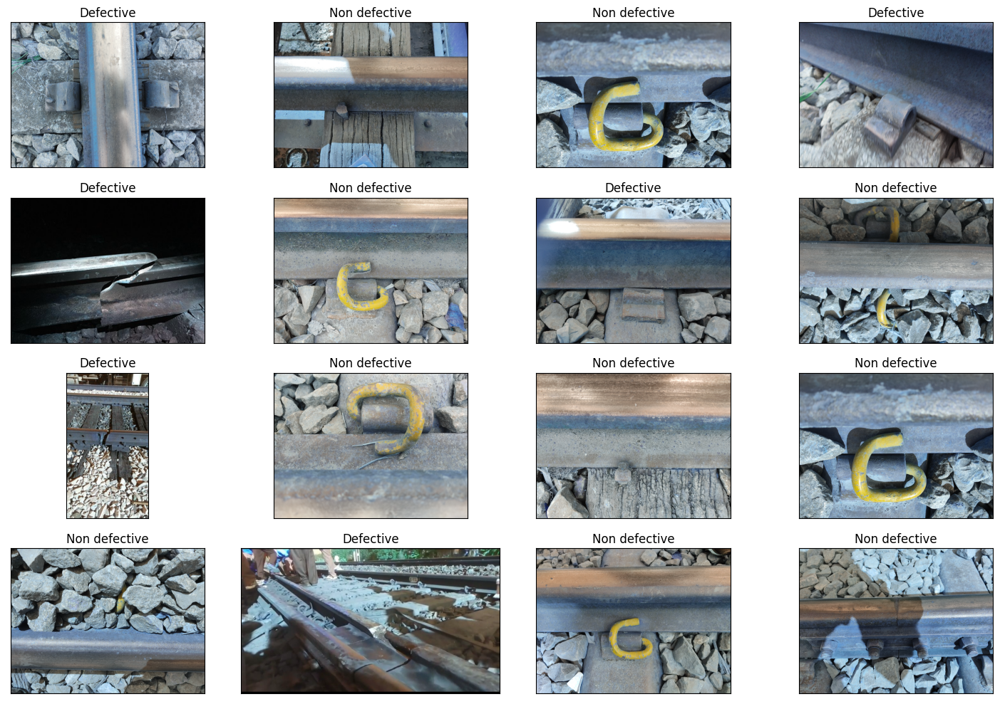

In [8]:
dim = np.ceil(np.sqrt(N_samples)).astype(int)
fig, ax = plt.subplots(dim, dim, figsize=(15, 10), tight_layout=True)
ax = ax.flatten()

for i, idx in enumerate(tqdm(random_sample.index)):
    image = cv.imread(images.img[idx])
    ax[i].imshow(image)
    ax[i].set_xticks(ticks=[])
    ax[i].set_yticks(ticks=[])
    ax[i].set_title(images.defect_str[idx])

plt.show()

Checking basic information on random sample: color components on RGB and HSV

100%|██████████| 16/16 [01:28<00:00,  5.55s/it]


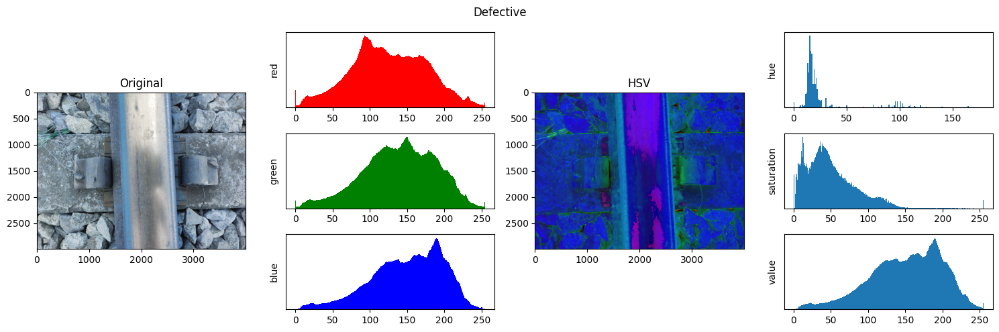

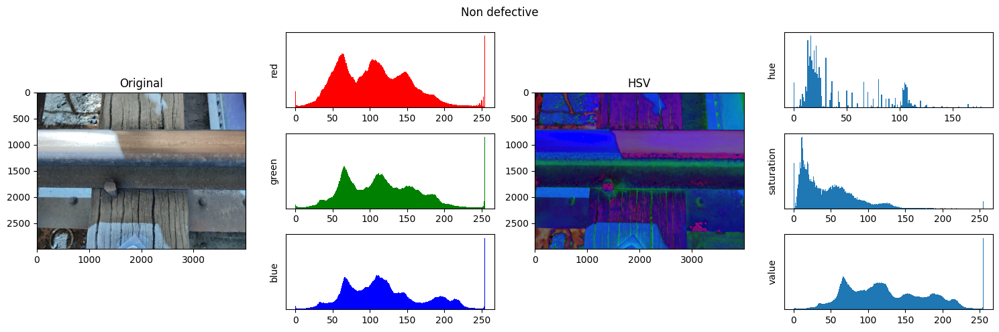

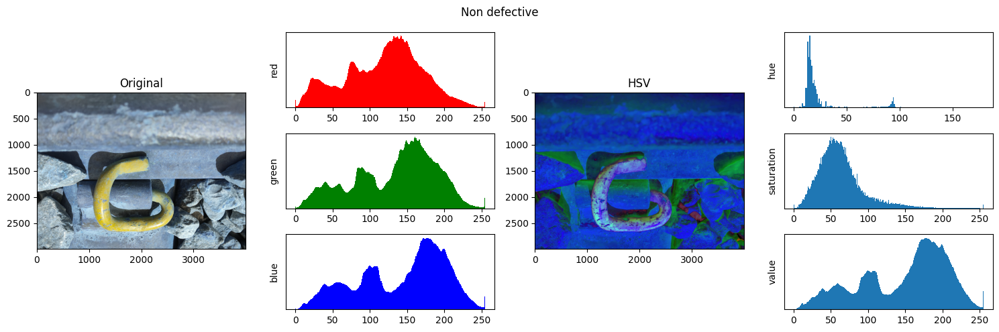

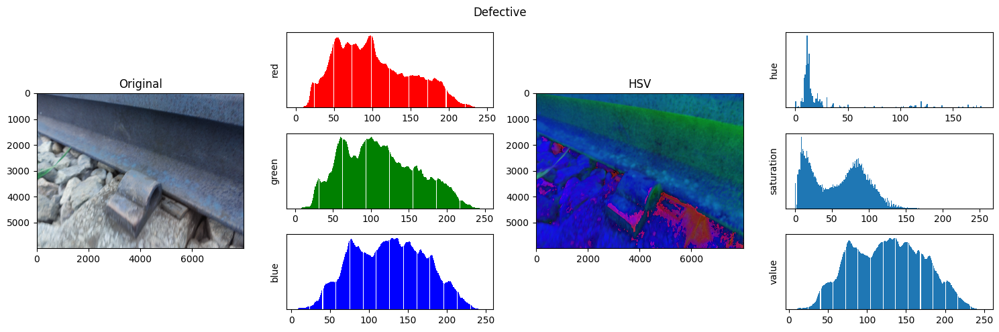

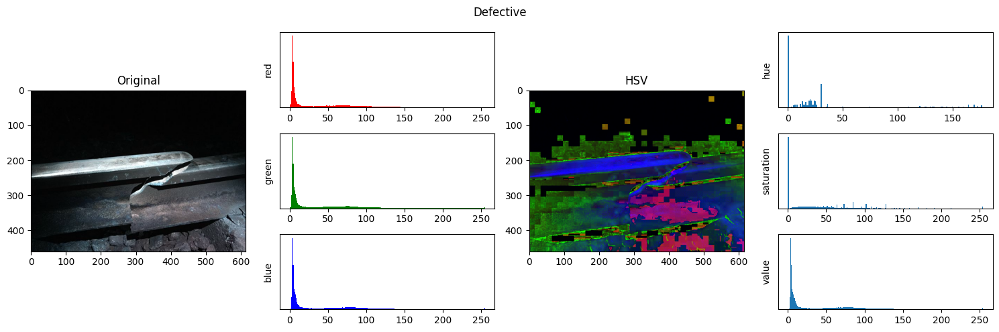

...

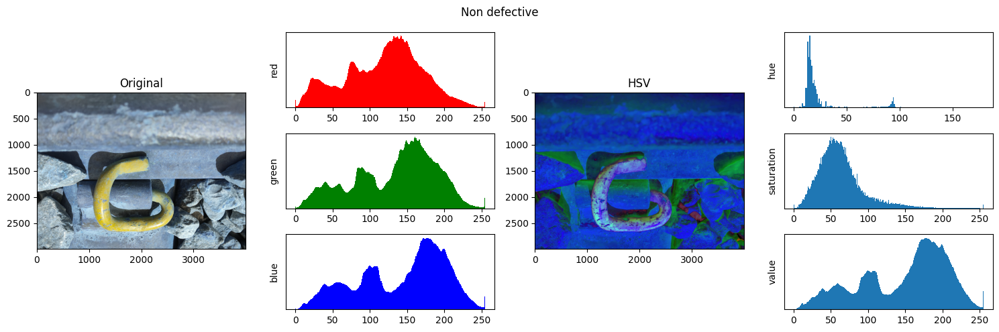

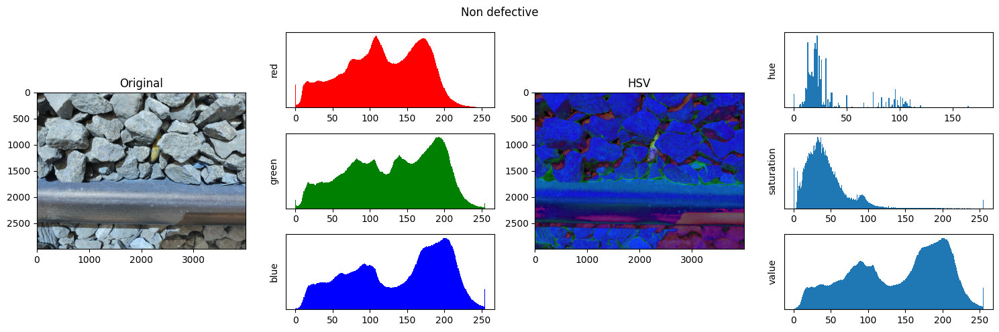

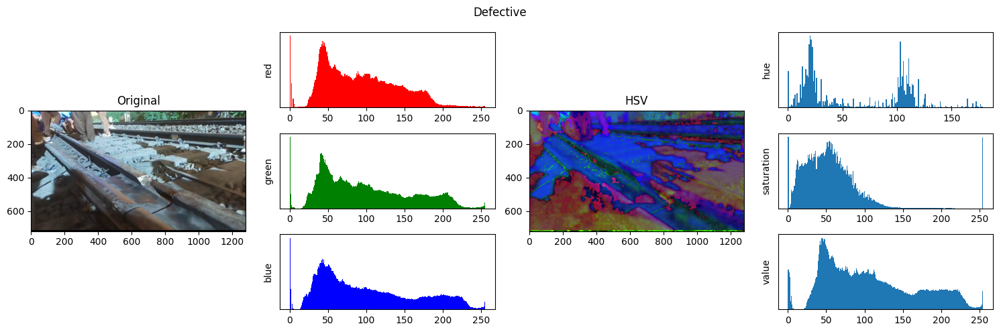

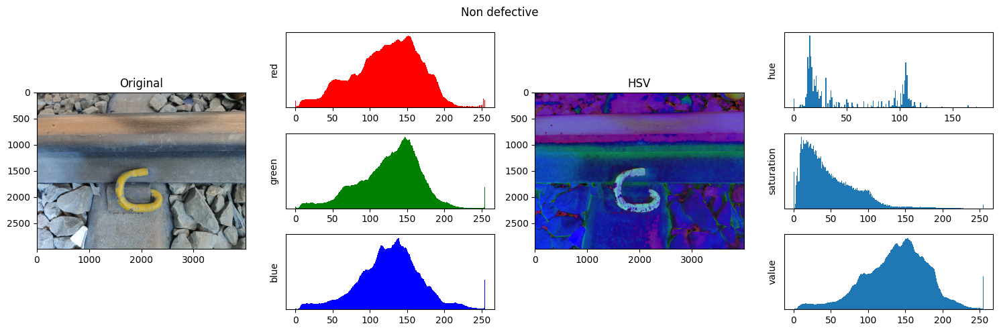

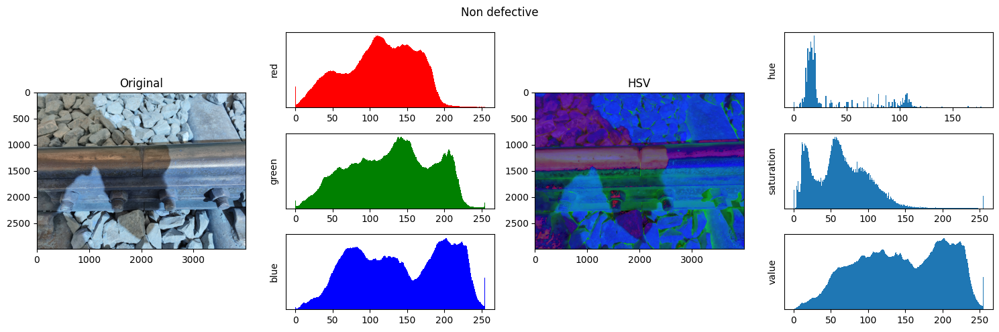

In [9]:
gs = gridspec.GridSpec(3, 4)

for each in tqdm(
    (
        random_sample[['img', 'defect_str']].to_numpy()
    ).tolist()
):
    fig = plt.figure(figsize=(15, 5), tight_layout=True)
    fig.suptitle(each[1])
    ax = [
        fig.add_subplot(gs[:, 0]),
        fig.add_subplot(gs[0, 1]),
        fig.add_subplot(gs[1, 1]),
        fig.add_subplot(gs[2, 1]),
        fig.add_subplot(gs[:, 2]),
        fig.add_subplot(gs[0, 3]),
        fig.add_subplot(gs[1, 3]),
        fig.add_subplot(gs[2, 3]),
    ]
    image = cv.imread(each[0])
    ax[0].imshow(image)
    ax[0].set_title('Original')
    
    for c, component in enumerate(['red', 'green', 'blue']):
        ax[c+1].hist(image[:, :, c].ravel(), bins=256, color=component)
        ax[c+1].set_ylabel(component)
        ax[c+1].set_yticks([])
        
    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    ax[4].imshow(hsv)
    ax[4].set_title('HSV')
    
    for c, component in enumerate(['hue', 'saturation', 'value']):
        bins = [180, 256, 256]
        ax[c+5].hist(hsv[:, :, c].ravel(), bins=bins[c])
        ax[c+5].set_ylabel(component)
        ax[c+5].set_yticks([])

We can consider a rail non-defective when it is not broken and there is proper mounting to the sleepers.

Idea: this might be detected via the continuity of the edges: on the top it should be continuous, at the bottom it should be periodically intersected by the mounting elements.

100%|██████████| 16/16 [00:05<00:00,  2.74it/s]


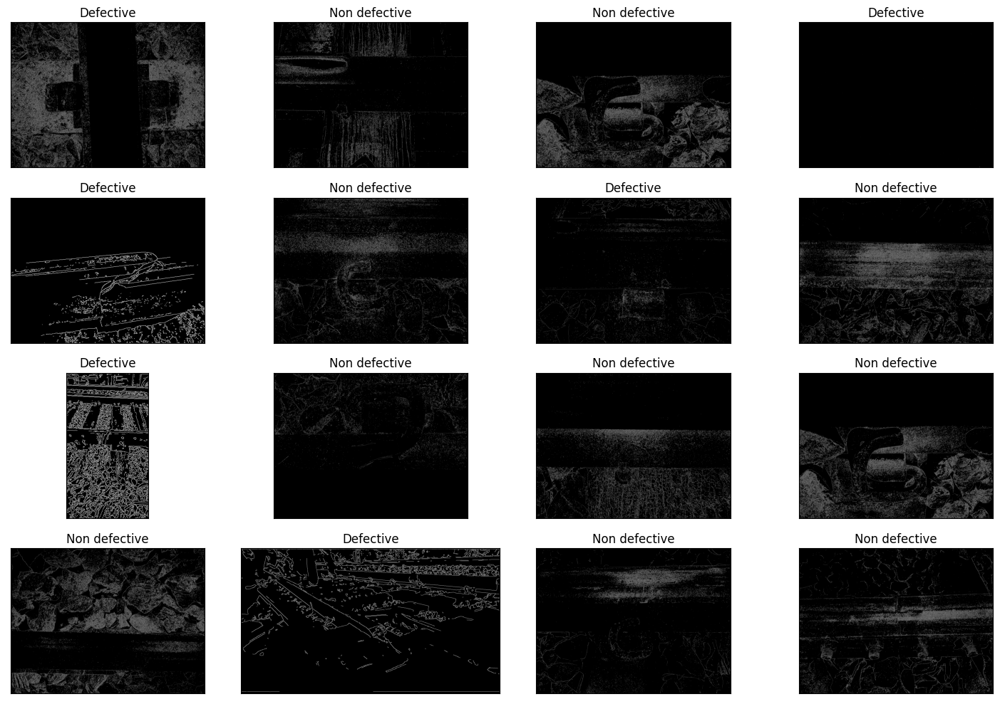

In [10]:
fig, ax = plt.subplots(dim, dim, figsize=(15, 10), tight_layout=True)
ax = ax.flatten()

for i, idx in enumerate(tqdm(random_sample.index)):
    image = cv.imread(images.img[idx])
    edges = cv.Canny(image, 150, 200)
    ax[i].imshow(edges, cmap='gray')
    ax[i].set_xticks(ticks=[])
    ax[i].set_yticks(ticks=[])
    ax[i].set_title(images.defect_str[idx])

plt.show()

Image processing pipeline

In [100]:
image_list = []
for i, img in enumerate(tqdm(images.img)):
    image = cv.imread(img)
    path = img.split('/')
    path[1] = preprocessed_folder
    dst = os.path.join(*path[1:])
    cv.imwrite(dst, image)

100%|██████████| 384/384 [05:10<00:00,  1.24it/s]


Loading preprocessed images for the neural network

In [136]:
batch_size = 32
img_height = 50
img_width = 50

train_data = tf.keras.utils.image_dataset_from_directory(
    os.path.join(preprocessed_folder, 'Train'),
    labels='inferred',
    image_size=(img_height, img_width), 
    batch_size=batch_size
)

validation_data = tf.keras.utils.image_dataset_from_directory(
    os.path.join(preprocessed_folder, 'Validation'),
    labels='inferred',
    image_size=(img_height, img_width), 
    batch_size=batch_size
)

class_names = train_data.class_names
print('Class names: ', class_names)

Found 300 files belonging to 2 classes.
Found 62 files belonging to 2 classes.
Class names:  ['Defective', 'Non defective']


Performance settings

In [58]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_data.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = validation_data.cache().prefetch(buffer_size=AUTOTUNE)

Constructing neural network

In [126]:
model = Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(units=int(img_height*img_width/2), activation='relu'),
    layers.Dense(units=int(img_height*img_width/4), activation='relu'),
    layers.Dense(len(class_names))
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 50, 50, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 50, 50, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 25, 25, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 25, 25, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 12, 12, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 12, 12, 64)       

Train the model

In [127]:
epochs = 10
history = model.fit(
    train_data,
    validation_data=validation_data,
    epochs=epochs
)

Epoch 1/10
10/10 [==============================] - 12s 311ms/step - loss: 0.7438 - accuracy: 0.5033 - val_loss: 0.6957 - val_accuracy: 0.5000
Epoch 2/10
10/10 [==============================] - 12s 338ms/step - loss: 0.6856 - accuracy: 0.5700 - val_loss: 0.6587 - val_accuracy: 0.5323
Epoch 3/10
10/10 [==============================] - 10s 323ms/step - loss: 0.6647 - accuracy: 0.6067 - val_loss: 0.7460 - val_accuracy: 0.5000
Epoch 4/10
10/10 [==============================] - 11s 369ms/step - loss: 0.6418 - accuracy: 0.6067 - val_loss: 0.6120 - val_accuracy: 0.5968
Epoch 5/10


2022-12-03 22:44:38.403015: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 193 of 256
2022-12-03 22:44:49.025674: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 245 of 256
2022-12-03 22:44:50.421626: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 39s 882ms/step - loss: 0.5569 - accuracy: 0.7067 - val_loss: 0.5934 - val_accuracy: 0.6290
Epoch 6/10
10/10 [==============================] - 10s 296ms/step - loss: 0.4622 - accuracy: 0.7967 - val_loss: 0.7712 - val_accuracy: 0.5806
Epoch 7/10
10/10 [==============================] - ETA: 0s - loss: 0.4076 - accuracy: 0.7700

2022-12-03 22:45:39.637095: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 44 of 256
2022-12-03 22:45:43.177824: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 34s 3s/step - loss: 0.4076 - accuracy: 0.7700 - val_loss: 0.7512 - val_accuracy: 0.5645
Epoch 8/10


2022-12-03 22:46:00.008936: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 163 of 256
2022-12-03 22:46:02.542729: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 16s 289ms/step - loss: 0.3250 - accuracy: 0.8633 - val_loss: 0.5247 - val_accuracy: 0.8065
Epoch 9/10
10/10 [==============================] - 11s 436ms/step - loss: 0.2272 - accuracy: 0.9367 - val_loss: 0.9823 - val_accuracy: 0.5806
Epoch 10/10


2022-12-03 22:46:27.369628: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 155 of 256
2022-12-03 22:46:37.617645: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 202 of 256
2022-12-03 22:46:47.553174: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 245 of 256
2022-12-03 22:46:48.931556: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 46s 692ms/step - loss: 0.1512 - accuracy: 0.9633 - val_loss: 0.6962 - val_accuracy: 0.6290


Metrics

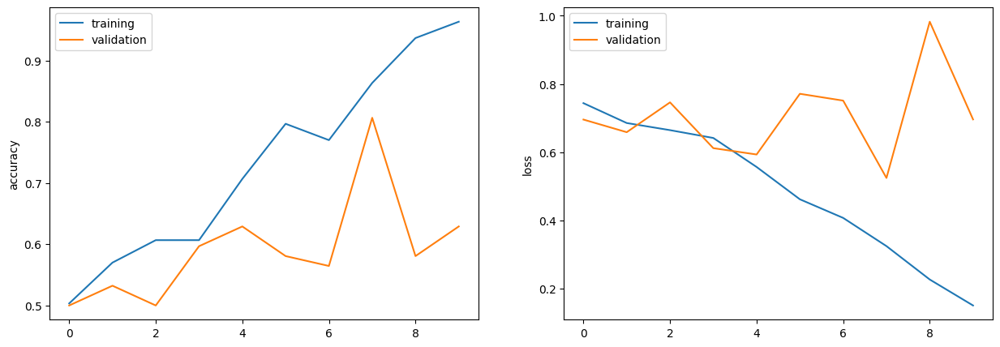

In [128]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.lineplot(x=np.arange(epochs), y='accuracy', data=history.history, ax=ax[0], label='training')
sns.lineplot(x=np.arange(epochs), y='val_accuracy', data=history.history, ax=ax[0], label='validation')
sns.lineplot(x=np.arange(epochs), y='loss', data=history.history, ax=ax[1], label='training')
sns.lineplot(x=np.arange(epochs), y='val_loss', data=history.history, ax=ax[1], label='validation')
plt.show()

Predictions

Found 22 files belonging to 2 classes.
1/1 [==============================] - 1s 904ms/step


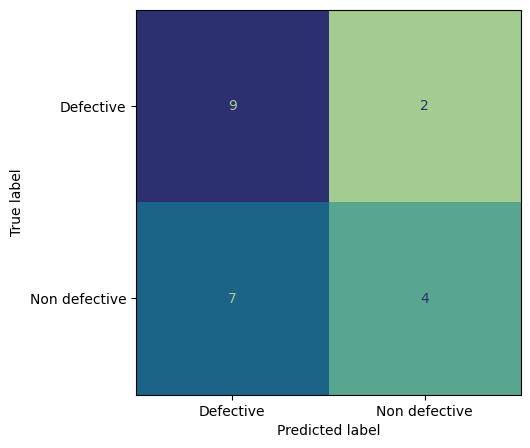

In [244]:
test_data = tf.keras.utils.image_dataset_from_directory(
    os.path.join(preprocessed_folder, 'Test'),
    labels='inferred',
    image_size=(img_height, img_width), 
    batch_size=batch_size
)

predictions = model.predict(test_data)
score = tf.nn.softmax(predictions)
y_pred = np.argmax(predictions, axis=1)
y_true = np.array(list(test_data.take(-1))[-1][-1])

fig, ax = plt.subplots(figsize=(10, 5))
ConfusionMatrixDisplay.from_predictions(y_true, y_pred, display_labels=class_names, ax=ax, cmap='crest', colorbar=False)
